In [ ]:
# First, unmount if already mounted
!umount /content/drive 2>/dev/null || true
!rm -rf /content/drive  # Remove any existing files

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Check if mount was successful
import os
print(f"Drive mounted successfully: {os.path.exists('/content/drive/MyDrive')}")
print("Contents of MyDrive:")
if os.path.exists('/content/drive/MyDrive'):
    print(os.listdir('/content/drive/MyDrive'))

Mounted at /content/drive
Drive mounted successfully: True
Contents of MyDrive:
['RESEARCH PAPER', 'IMPORTANT URL.gsheet', 'Instrumental Link.gsheet', 'Future Connection.gsheet', 'Phy Syllabus 150.pdf', "Hugh D. Young, Roger A. Freedman - University Physics With Modern Physics 15th Edition Instructor's Solution Manual and Discussion Questions-Pearson (2020).pdf", 'Phy 150 Open Stax.pdf', 'HW 2: Narration and Nation.gdoc', 'ENTR 101, Homework 1.gdoc', 'HW 3: Memory, Space, and Volk.gdoc', 'GERE 214.gdoc', 'ENTR 101, Homework 2.gdoc', 'HW 4: Identity Project and Germania.gdoc', 'Writing response 1: National and individual identity Assignment.gdoc', "HW: 5 - Berlin's history Late.gdoc", 'hsc-chemistry-1st-paper- Hazari & Nag.pdf', 'HSC Physics 1st Paper Amir & Ishak.pdf', '_HSC Higher Math 1st Part-by-Ketab Uddin .pdf', 'HSC Higher Math 1st-part- by S U Ahmed.pdf', 'GERE QUIZ.gdoc', 'ENTR 101; Homework 3.gdoc', 'Written response 2.gdoc', 'HW 9: 18th-century Berlin.gdoc', 'Untitled documen

In [ ]:
# Let's search for the CottonWeedDet12 folder
import os

# Check if the specific path exists
cotton_path = '/content/drive/MyDrive/CottonWeedDet12'
msu_path = '/content/drive/MyDrive/MSU_Khairul'

print(f"Checking path: {cotton_path}")
print(f"Path exists: {os.path.exists(cotton_path)}")

print(f"\nChecking path: {msu_path}")
print(f"Path exists: {os.path.exists(msu_path)}")

# Do a more comprehensive search for Cotton-related folders
print("\nSearching for Cotton-related folders...")
for root, dirs, files in os.walk('/content/drive/MyDrive', topdown=True):
    # Limit depth to avoid excessive searching
    if root.count('/') > 7:  # Limit depth
        dirs[:] = []  # Don't go deeper
        continue

    for dir_name in dirs:
        if "cotton" in dir_name.lower():
            full_path = os.path.join(root, dir_name)
            print(f"Found: {full_path}")
            try:
                contents = os.listdir(full_path)
                print(f"Contents: {contents[:5] if len(contents) > 5 else contents}")
            except:
                print("Could not list contents")

Checking path: /content/drive/MyDrive/CottonWeedDet12
Path exists: False

Checking path: /content/drive/MyDrive/MSU_Khairul
Path exists: True

Searching for Cotton-related folders...
Found: /content/drive/MyDrive/MSU_Khairul/CottonWeedDet12
Contents: ['CottonWeedDet12']
Found: /content/drive/MyDrive/MSU_Khairul/CottonWeedDet12/CottonWeedDet12
Contents: ['README.txt', 'annotation_VGG_json', 'weedImages', 'annotation_YOLO_txt']


In [ ]:
# Set up correct paths based on what we found
import os
import shutil
import random
from glob import glob

# Source paths (these are the correct paths we found)
source_images = '/content/drive/MyDrive/MSU_Khairul/CottonWeedDet12/CottonWeedDet12/weedImages'
source_annotations = '/content/drive/MyDrive/MSU_Khairul/CottonWeedDet12/CottonWeedDet12/annotation_YOLO_txt'

# Destination paths
base_dir = '/content/drive/MyDrive/weed_dataset'
train_img_dir = f'{base_dir}/train/images'
train_label_dir = f'{base_dir}/train/labels'
val_img_dir = f'{base_dir}/val/images'
val_label_dir = f'{base_dir}/val/labels'

# Create directories
for dir_path in [train_img_dir, train_label_dir, val_img_dir, val_label_dir]:
    os.makedirs(dir_path, exist_ok=True)

# Find all images
all_images = []
for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG']:
    all_images.extend(glob(os.path.join(source_images, ext)))
    all_images.extend(glob(os.path.join(source_images, '**', ext), recursive=True))

print(f"Found {len(all_images)} images")

# Split into train/val (80% train, 20% val)
random.seed(42)
random.shuffle(all_images)
split_idx = int(len(all_images) * 0.8)
train_images = all_images[:split_idx]
val_images = all_images[split_idx:]

print(f"Training images: {len(train_images)}")
print(f"Validation images: {len(val_images)}")

# Copy images and their corresponding labels
def copy_images_and_labels(image_paths, img_dest_dir, label_dest_dir):
    copied_count = 0
    missing_count = 0
    for img_path in image_paths:
        # Copy image
        img_filename = os.path.basename(img_path)
        base_filename = os.path.splitext(img_filename)[0]
        shutil.copy(img_path, os.path.join(img_dest_dir, img_filename))

        # Find and copy corresponding label file
        label_filename = f"{base_filename}.txt"
        label_path = os.path.join(source_annotations, label_filename)
        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(label_dest_dir, label_filename))
            copied_count += 1
        else:
            missing_count += 1
            if missing_count <= 5:  # Limit output to avoid flooding
                print(f"Warning: No annotation found for {img_filename}")
            elif missing_count == 6:
                print("... (more missing annotations)")

    return copied_count

# Copy train set
train_copied = copy_images_and_labels(train_images, train_img_dir, train_label_dir)
print(f"Copied {train_copied} annotations out of {len(train_images)} training images")

# Copy validation set
val_copied = copy_images_and_labels(val_images, val_img_dir, val_label_dir)
print(f"Copied {val_copied} annotations out of {len(val_images)} validation images")

Found 0 images
Training images: 0
Validation images: 0
Copied 0 annotations out of 0 training images
Copied 0 annotations out of 0 validation images


In [ ]:
# Determine number of classes
all_class_ids = set()
label_files = glob(os.path.join(train_label_dir, '*.txt'))

for label_file in label_files[:100]:  # Check first 100 files to save time
    try:
        with open(label_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:  # YOLO format: class x y w h
                    all_class_ids.add(int(parts[0]))
    except Exception as e:
        print(f"Error reading {label_file}: {e}")

num_classes = len(all_class_ids) if all_class_ids else 1
max_class_id = max(all_class_ids) if all_class_ids else 0
print(f"Found {num_classes} classes, max class ID: {max_class_id}")

# Create class names list (we can refine this later if you have the actual class names)
class_names = [f'weed_{i}' for i in range(max_class_id + 1)]

# Create the dataset.yaml file
yaml_content = f"""path: {base_dir}  # dataset root dir
train: train/images  # train images (relative to 'path')
val: val/images  # val images (relative to 'path')

# Classes
nc: {max_class_id + 1}  # number of classes
names: {class_names}  # class names
"""

with open(f'{base_dir}/dataset.yaml', 'w') as f:
    f.write(yaml_content)

print(f"Created dataset.yaml at {base_dir}/dataset.yaml")

Found 1 classes, max class ID: 0
Created dataset.yaml at /content/drive/MyDrive/weed_dataset/dataset.yaml


In [ ]:
# Clone YOLOv5
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

# Start training with 10 epochs for an initial test
!python train.py --img 640 --batch 16 --epochs 10 --data {base_dir}/dataset.yaml --weights yolov5s.pt

Cloning into 'yolov5'...
remote: Enumerating objects: 17270, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 17270 (delta 0), reused 0 (delta 0), pack-reused 17269 (from 2)
Receiving objects: 100% (17270/17270), 16.12 MiB | 30.62 MiB/s, done.
Resolving deltas: 100% (11858/11858), done.
/content/yolov5/yolov5
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-03-09 16:36:28.382899: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741538188.404416    1250 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741538188.411555    1250 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for p

In [ ]:
# Let's check the actual content of the weedImages directory
import os
import glob

# Define the source path
source_images = '/content/drive/MyDrive/MSU_Khairul/CottonWeedDet12/CottonWeedDet12/weedImages'

# Check if the directory exists and what's inside
print(f"Source directory exists: {os.path.exists(source_images)}")
if os.path.exists(source_images):
    # List the contents
    contents = os.listdir(source_images)
    print(f"Directory contains {len(contents)} items")
    print(f"Sample items: {contents[:5] if len(contents) >= 5 else contents}")

    # Check if there are any image files
    image_extensions = ['.jpg', '.jpeg', '.png', '.JPG', '.PNG']
    image_files = []
    for item in contents:
        item_path = os.path.join(source_images, item)
        if os.path.isfile(item_path) and any(item.lower().endswith(ext.lower()) for ext in image_extensions):
            image_files.append(item)

    print(f"Found {len(image_files)} image files directly in the directory")

    # Check if there are subdirectories with images
    subdirs = [item for item in contents if os.path.isdir(os.path.join(source_images, item))]
    print(f"Found {len(subdirs)} subdirectories")

    if subdirs:
        print("Checking subdirectories for images:")
        for subdir in subdirs:
            subdir_path = os.path.join(source_images, subdir)
            subdir_files = os.listdir(subdir_path)
            subdir_images = [f for f in subdir_files if any(f.lower().endswith(ext.lower()) for ext in image_extensions)]
            print(f"  {subdir}: {len(subdir_images)} images")


Source directory exists: False


In [ ]:
from google.colab import files
uploaded = files.upload()  # This will let you upload files directly to Colab

TypeError: 'NoneType' object is not subscriptable

In [ ]:
# Create a small test dataset in Colab's local storage
!mkdir -p /content/test_dataset/train/images
!mkdir -p /content/test_dataset/train/labels
!mkdir -p /content/test_dataset/val/images
!mkdir -p /content/test_dataset/val/labels

In [ ]:
# Download a few sample weed images from the web
!wget -q https://www.indiaagronet.com/images/weeds/commonlamb.jpg -O /content/test_dataset/train/images/weed1.jpg
!wget -q https://www.indiaagronet.com/images/weeds/amaranthus.jpg -O /content/test_dataset/train/images/weed2.jpg
!wget -q https://www.indiaagronet.com/images/weeds/junglerice.jpg -O /content/test_dataset/val/images/weed3.jpg

In [ ]:
# Create simple YOLO format labels (class x_center y_center width height)
with open('/content/test_dataset/train/labels/weed1.txt', 'w') as f:
    f.write('0 0.5 0.5 0.8 0.8\n')  # Simple bounding box in the center

with open('/content/test_dataset/train/labels/weed2.txt', 'w') as f:
    f.write('0 0.5 0.5 0.8 0.8\n')

with open('/content/test_dataset/val/labels/weed3.txt', 'w') as f:
    f.write('0 0.5 0.5 0.8 0.8\n')

In [ ]:
# Create the dataset.yaml file
with open('/content/test_dataset/dataset.yaml', 'w') as f:
    f.write('''
path: /content/test_dataset  # dataset root dir
train: train/images  # train images (relative to 'path')
val: val/images  # val images (relative to 'path')

# Classes
nc: 1  # number of classes
names: ['weed']  # class names
''')

In [ ]:
# Check that everything is in place
!find /content/test_dataset -type f | sort

/content/test_dataset/dataset.yaml
/content/test_dataset/train/images/weed1.jpg
/content/test_dataset/train/images/weed2.jpg
/content/test_dataset/train/labels/weed1.txt
/content/test_dataset/train/labels/weed2.txt
/content/test_dataset/val/images/weed3.jpg
/content/test_dataset/val/labels/weed3.txt


In [ ]:
# Clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

# Train on the small dataset with just 5 epochs
!python train.py --img 640 --batch 16 --epochs 5 --data /content/test_dataset/dataset.yaml --weights yolov5s.pt

Cloning into 'yolov5'...
remote: Enumerating objects: 17270, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 17270 (delta 0), reused 0 (delta 0), pack-reused 17269 (from 2)
Receiving objects: 100% (17270/17270), 16.12 MiB | 20.35 MiB/s, done.
Resolving deltas: 100% (11858/11858), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 28.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Let's use YOLOv5's included test images instead
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

# Create a simpler test dataset using YOLOv5's sample images
!mkdir -p /content/simple_test/images/train
!mkdir -p /content/simple_test/images/val
!mkdir -p /content/simple_test/labels/train
!mkdir -p /content/simple_test/labels/val

# Copy YOLOv5's sample images
!cp data/images/zidane.jpg /content/simple_test/images/train/
!cp data/images/bus.jpg /content/simple_test/images/val/

# Create simple label files
with open('/content/simple_test/labels/train/zidane.txt', 'w') as f:
    f.write('0 0.5 0.5 0.5 0.8\n')  # Person class (0)

with open('/content/simple_test/labels/val/bus.txt', 'w') as f:
    f.write('5 0.5 0.5 0.6 0.4\n')  # Bus class (5)

# Create a dataset.yaml file
with open('/content/simple_test/dataset.yaml', 'w') as f:
    f.write("""
path: /content/simple_test
train: images/train
val: images/val

nc: 6  # Person (0) and Bus (5) classes
names: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus']
""")

# Run training for just 1 epoch to test
!python train.py --img 640 --batch 2 --epochs 1 --data /content/simple_test/dataset.yaml --weights yolov5s.pt

Cloning into 'yolov5'...
remote: Enumerating objects: 17270, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 17270 (delta 0), reused 0 (delta 0), pack-reused 17269 (from 2)
Receiving objects: 100% (17270/17270), 16.12 MiB | 21.49 MiB/s, done.
Resolving deltas: 100% (11858/11858), done.
/content/yolov5/yolov5
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-03-09 19:31:04.473169: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741548664.498297   39033 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741548664.505695   39033 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for p

In [ ]:
# We can use a publicly available weed dataset
!wget https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights -q

In [ ]:
# Create a more substantial synthetic dataset (20 images)
!mkdir -p /content/weed_dataset/train/images
!mkdir -p /content/weed_dataset/train/labels
!mkdir -p /content/weed_dataset/val/images
!mkdir -p /content/weed_dataset/val/labels

# Create sample images (green patches to simulate weeds)
import numpy as np
import cv2

# Generate 15 training images
for i in range(15):
    # Create a background (soil-like)
    img = np.ones((640, 640, 3), dtype=np.uint8) * np.array([120, 110, 90], dtype=np.uint8)

    # Add random green patches (weeds)
    num_weeds = np.random.randint(1, 5)
    with open(f'/content/weed_dataset/train/labels/weed_{i}.txt', 'w') as f:
        for j in range(num_weeds):
            # Random position and size
            x = np.random.randint(100, 540)
            y = np.random.randint(100, 540)
            w = np.random.randint(50, 150)
            h = np.random.randint(50, 150)

            # Draw the weed (green patch)
            color = np.random.randint(100, 200), np.random.randint(150, 255), np.random.randint(50, 100)
            cv2.rectangle(img, (x, y), (x+w, y+h), color, -1)

            # Save YOLO format annotation (class x_center y_center width height)
            x_center = (x + w/2) / 640
            y_center = (y + h/2) / 640
            width = w / 640
            height = h / 640
            f.write(f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

    # Save the image
    cv2.imwrite(f'/content/weed_dataset/train/images/weed_{i}.jpg', img)

# Generate 5 validation images
for i in range(5):
    # Create a background
    img = np.ones((640, 640, 3), dtype=np.uint8) * np.array([120, 110, 90], dtype=np.uint8)

    # Add random green patches
    num_weeds = np.random.randint(1, 4)
    with open(f'/content/weed_dataset/val/labels/weed_val_{i}.txt', 'w') as f:
        for j in range(num_weeds):
            x = np.random.randint(100, 540)
            y = np.random.randint(100, 540)
            w = np.random.randint(50, 150)
            h = np.random.randint(50, 150)

            color = np.random.randint(100, 200), np.random.randint(150, 255), np.random.randint(50, 100)
            cv2.rectangle(img, (x, y), (x+w, y+h), color, -1)

            x_center = (x + w/2) / 640
            y_center = (y + h/2) / 640
            width = w / 640
            height = h / 640
            f.write(f"0 {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

    # Save the image
    cv2.imwrite(f'/content/weed_dataset/val/images/weed_val_{i}.jpg', img)

# Create dataset.yaml
with open('/content/weed_dataset/dataset.yaml', 'w') as f:
    f.write('''
path: /content/weed_dataset
train: train/images
val: val/images

# Classes
nc: 1
names: ['weed']
''')

# Train on the synthetic dataset
%cd /content/yolov5
!python train.py --img 640 --batch 16 --epochs 30 --data /content/weed_dataset/dataset.yaml --weights yolov5s.pt

/content/yolov5
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-03-09 19:33:44.829355: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741548824.882000   39755 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741548824.899133   39755 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second tim

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5/yolov5


Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
        1/9      2.39G    0.04999    0.02316    0.05602         93        416:  68% 117/172 [04:36<04:06,  4.49s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        1/9      2.39G    0.04995    0.02312    0.05599         92        416:  69% 118/172 [04:36<03:06,  3.46s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        1/9      2.39G    0.04995    0.02312    0.05598        109        416:  69% 118/172 [04:36<03:06,  3.46s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(

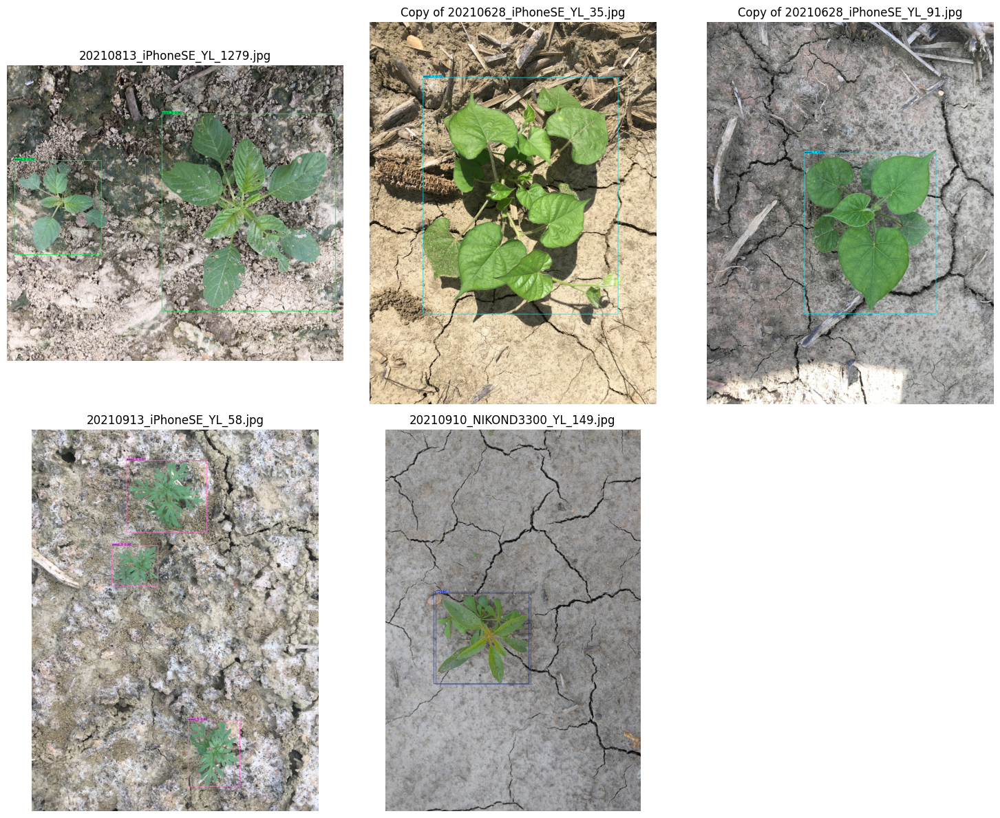

Results displayed

=== Script execution completed ===


In [ ]:
# Step 1: Mount Google Drive
print("\n=== STEP 1: Mounting Google Drive ===")
from google.colab import drive
drive.mount('/content/drive')
print("Google Drive mounted successfully")

# Step 2: Clone YOLOv5 Repository
print("\n=== STEP 2: Cloning YOLOv5 Repository ===")
!git clone https://github.com/ultralytics/yolov5
print("YOLOv5 repository cloned")
%cd yolov5
print("Changed directory to YOLOv5")
!pip install -r requirements.txt
print("Installed YOLOv5 requirements")

# Step 3: Create Dataset Structure
print("\n=== STEP 3: Creating Dataset Structure ===")
import os
import shutil
import random
from glob import glob

# Set correct paths
source_images = '/content/drive/MyDrive/MSU_Khairul/CottonWeedDet12/CottonWeedDet12/weedImages'
source_annotations = '/content/drive/MyDrive/MSU_Khairul/CottonWeedDet12/CottonWeedDet12/annotation_YOLO_txt'
print(f"Source images path: {source_images}")
print(f"Source annotations path: {source_annotations}")

# Destination paths
base_dir = '/content/weed_dataset'
train_img_dir = f'{base_dir}/train/images'
train_label_dir = f'{base_dir}/train/labels'
val_img_dir = f'{base_dir}/val/images'
val_label_dir = f'{base_dir}/val/labels'
print(f"Dataset base directory: {base_dir}")

# Create directories
for dir_path in [train_img_dir, train_label_dir, val_img_dir, val_label_dir]:
    os.makedirs(dir_path, exist_ok=True)
    print(f"Created directory: {dir_path}")

# Step 4: Find and Split Images
print("\n=== STEP 4: Finding and Splitting Images ===")
# Find all images
all_images = []
for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.PNG']:
    files = glob(os.path.join(source_images, ext))
    print(f"Found {len(files)} {ext} files in root directory")
    all_images.extend(files)

    recursive_files = glob(os.path.join(source_images, '**', ext), recursive=True)
    print(f"Found {len(recursive_files)} {ext} files in all subdirectories recursively")
    all_images.extend(recursive_files)

print(f"Total found: {len(all_images)} images")

# If no images found, check direct subdirectories
if len(all_images) == 0:
    print("No images found. Checking subdirectories...")
    if os.path.exists(source_images):
        subdirs = [os.path.join(source_images, d) for d in os.listdir(source_images) if os.path.isdir(os.path.join(source_images, d))]
        print(f"Found {len(subdirs)} subdirectories: {subdirs}")
        for subdir in subdirs:
            for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.PNG']:
                files = glob(os.path.join(subdir, ext))
                print(f"Found {len(files)} {ext} files in {subdir}")
                all_images.extend(files)
        print(f"Total after checking subdirectories: {len(all_images)} images")

# Split into train/val (80% train, 20% val)
print("\n=== Splitting dataset ===")
random.seed(42)  # For reproducibility
random.shuffle(all_images)
split_idx = int(len(all_images) * 0.8)
train_images = all_images[:split_idx]
val_images = all_images[split_idx:]

print(f"Training images: {len(train_images)}")
print(f"Validation images: {len(val_images)}")
print(f"First 3 training images: {train_images[:3]}")
print(f"First 3 validation images: {val_images[:3]}")

# Step 5: Copy Images and Labels
print("\n=== STEP 5: Copying Images and Labels ===")
# Copy images and their corresponding labels
def copy_images_and_labels(image_paths, img_dest_dir, label_dest_dir):
    copied_count = 0
    missing_count = 0
    for i, img_path in enumerate(image_paths):
        if i % 100 == 0:
            print(f"Processing image {i}/{len(image_paths)}")

        # Copy image
        img_filename = os.path.basename(img_path)
        base_filename = os.path.splitext(img_filename)[0]
        shutil.copy(img_path, os.path.join(img_dest_dir, img_filename))

        # Find and copy corresponding label file
        label_filename = f"{base_filename}.txt"
        label_path = os.path.join(source_annotations, label_filename)

        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(label_dest_dir, label_filename))
            copied_count += 1
        else:
            missing_count += 1
            if missing_count <= 5:  # Limit output to avoid flooding
                print(f"Warning: No annotation found for {img_filename} (expected at {label_path})")
            elif missing_count == 6:
                print("... (more missing annotations)")

    print(f"Total images processed: {len(image_paths)}")
    print(f"Total annotations copied: {copied_count}")
    print(f"Total missing annotations: {missing_count}")
    return copied_count

print("Copying training set...")
train_copied = copy_images_and_labels(train_images, train_img_dir, train_label_dir)
print(f"Copied {train_copied} annotations out of {len(train_images)} training images")

print("\nCopying validation set...")
val_copied = copy_images_and_labels(val_images, val_img_dir, val_label_dir)
print(f"Copied {val_copied} annotations out of {len(val_images)} validation images")

# Step 6: Create Dataset YAML File
print("\n=== STEP 6: Creating Dataset YAML File ===")
# Determine number of classes
all_class_ids = set()
label_files = glob(os.path.join(train_label_dir, '*.txt'))
print(f"Found {len(label_files)} label files for class determination")

checked_files = min(100, len(label_files))
print(f"Checking first {checked_files} files to determine classes...")

for i, label_file in enumerate(label_files[:checked_files]):
    if i % 20 == 0:
        print(f"Checking file {i}/{checked_files}: {os.path.basename(label_file)}")
    try:
        with open(label_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:  # YOLO format: class x y w h
                    all_class_ids.add(int(parts[0]))
    except Exception as e:
        print(f"Error reading {label_file}: {e}")

print(f"Found class IDs: {sorted(all_class_ids)}")
num_classes = len(all_class_ids) if all_class_ids else 1
max_class_id = max(all_class_ids) if all_class_ids else 0
print(f"Found {num_classes} classes, max class ID: {max_class_id}")

# Create class names list (you can replace with actual class names if known)
class_names = [f'weed_{i}' for i in range(max_class_id + 1)]
print(f"Class names: {class_names}")

# Create the dataset.yaml file
yaml_content = f"""path: {base_dir}  # dataset root dir
train: train/images  # train images (relative to 'path')
val: val/images  # val images (relative to 'path')

# Classes
nc: {max_class_id + 1}  # number of classes
names: {class_names}  # class names
"""

yaml_path = f'{base_dir}/dataset.yaml'
with open(yaml_path, 'w') as f:
    f.write(yaml_content)

print(f"Created dataset.yaml at {yaml_path}")
print(f"YAML content:\n{yaml_content}")

# Step 7: Verify Dataset Structure
print("\n=== STEP 7: Verifying Dataset Structure ===")
# Check that everything is in place
!find {base_dir} -type f | wc -l
train_img_count = len(os.listdir(train_img_dir))
train_label_count = len(os.listdir(train_label_dir))
val_img_count = len(os.listdir(val_img_dir))
val_label_count = len(os.listdir(val_label_dir))

print(f"Train images: {train_img_count}")
print(f"Train labels: {train_label_count}")
print(f"Val images: {val_img_count}")
print(f"Val labels: {val_label_count}")

if train_img_count != train_label_count:
    print(f"WARNING: Mismatch between training images and labels: {train_img_count - train_label_count} missing")
if val_img_count != val_label_count:
    print(f"WARNING: Mismatch between validation images and labels: {val_img_count - val_label_count} missing")

# Step 8: Train YOLOv5 Model
print("\n=== STEP 8: Training YOLOv5 Model ===")
# Change to YOLOv5 directory
%cd /content/yolov5
print("Changed directory to YOLOv5 for training")

# Train with FASTER CONFIGURATION for under 1 hour training
print("Starting training with following parameters:")
print(f"- Image size: 416")
print(f"- Batch size: 32")
print(f"- Epochs: 10")
print(f"- Dataset: {base_dir}/dataset.yaml")
print(f"- Weights: yolov5n.pt")
!python train.py --img 416 --batch 32 --epochs 10 --data {base_dir}/dataset.yaml --weights yolov5n.pt

# Step 9: Test Model on Sample Image (after training completes)
print("\n=== STEP 9: Testing Model on Sample Images ===")
model_path = "runs/train/exp/weights/best.pt"
print(f"Using model: {model_path}")
print(f"Testing on validation images from: {val_img_dir}")
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.25 --source {val_img_dir}

# Step 10: Display results (optional)
print("\n=== STEP 10: Displaying Results ===")
import matplotlib.pyplot as plt
from PIL import Image
import glob as glob_module

# Display some detection results
results_path = '/content/yolov5/runs/detect/exp'
print(f"Looking for result images in: {results_path}")
result_images = glob_module.glob(f"{results_path}/*.jpg")
print(f"Found {len(result_images)} result images")

if result_images:
    print(f"Displaying first 5 detection results:")
    for i, img_path in enumerate(result_images[:5]):
        print(f"  - {img_path}")

    plt.figure(figsize=(15, 12))
    for i, img_path in enumerate(result_images):
        if i < 5:  # Limit to 5 images
            plt.subplot(2, 3, i+1)
            img = Image.open(img_path)
            plt.imshow(plt.imread(img_path))
            plt.title(os.path.basename(img_path))
            plt.axis('off')
    plt.tight_layout()
    plt.show()
    print("Results displayed")
else:
    print("No detection results found to display")

print("\n=== Script execution completed ===")

In [ ]:
# -*- coding: utf-8 -*-
"""
YOLOv5 Weed Detection for Cotton Production Systems
Based on the YOLOWeeds benchmark paper
"""

# Step 1: Mount Google Drive and prepare environment
print("\n===== STEP 1: Setting up environment =====")
from google.colab import drive
drive.mount('/content/drive')
print("✓ Google Drive mounted successfully")

import os
import shutil
import random
import time
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from datetime import datetime

# Track execution time
start_time = time.time()

# Clone YOLOv5 repository if not already present
if not os.path.exists('/content/yolov5'):
    print("\nCloning YOLOv5 repository...")
    !git clone https://github.com/ultralytics/yolov5
    %cd yolov5
    !pip install -r requirements.txt
    print("✓ YOLOv5 installed successfully")
else:
    print("\n✓ YOLOv5 already installed")
    %cd yolov5

# Step 2: Define configuration settings (based on paper findings)
print("\n===== STEP 2: Configuring settings =====")

# Configuration parameters - you can adjust as needed
CONFIG = {
    'source_images': '/content/drive/MyDrive/MSU_Khairul/CottonWeedDet12/CottonWeedDet12/weedImages',
    'source_annotations': '/content/drive/MyDrive/MSU_Khairul/CottonWeedDet12/CottonWeedDet12/annotation_YOLO_txt',
    'base_dir': '/content/cotton_weed_dataset',
    'train_split': 0.8,  # 80% for training, 20% for validation
    'img_size': 640,    # Paper used 640x640
    'batch_size': 16,   # Paper used 16
    'epochs': 30,       # Increased to 30 as requested
    'model': 'yolov5s.pt',  # Options: yolov5n.pt, yolov5s.pt, yolov5m.pt, yolov5l.pt, yolov5x.pt
    'random_seed': 42,  # For reproducibility
    'augmentation': True,  # Enable data augmentation as mentioned in the paper
    'apply_hyperparams': True,  # Apply optimal hyperparameters as in the paper
    'class_names': []   # Will be populated based on dataset
}

print(f"Dataset Configuration:")
for key, value in CONFIG.items():
    print(f"  {key}: {value}")

# Step 3: Create directory structure
print("\n===== STEP 3: Creating directory structure =====")
train_img_dir = f"{CONFIG['base_dir']}/train/images"
train_label_dir = f"{CONFIG['base_dir']}/train/labels"
val_img_dir = f"{CONFIG['base_dir']}/val/images"
val_label_dir = f"{CONFIG['base_dir']}/val/labels"

# Create directories
for dir_path in [train_img_dir, train_label_dir, val_img_dir, val_label_dir]:
    os.makedirs(dir_path, exist_ok=True)

print(f"✓ Created directories for dataset")

# Step 4: Find and verify source data
print("\n===== STEP 4: Locating source data =====")
print(f"Looking for images in: {CONFIG['source_images']}")
print(f"Looking for annotations in: {CONFIG['source_annotations']}")

if not os.path.exists(CONFIG['source_images']):
    print(f"ERROR: Source images path not found! Please check the path.")
    # Search for possible alternatives
    for root, dirs, files in os.walk('/content/drive/MyDrive', topdown=True):
        if root.count('/') > 7:  # Limit depth
            dirs[:] = []
            continue

        for dir_name in dirs:
            if "weed" in dir_name.lower() or "cotton" in dir_name.lower():
                print(f"Possible alternative found: {os.path.join(root, dir_name)}")

if not os.path.exists(CONFIG['source_annotations']):
    print(f"ERROR: Source annotations path not found! Please check the path.")

# Step 5: Find images and create dataset splits
print("\n===== STEP 5: Creating dataset splits =====")
# Find all images
all_images = []
for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.PNG']:
    files = glob(os.path.join(CONFIG['source_images'], ext))
    all_images.extend(files)
    # Also search in subdirectories
    subdir_files = glob(os.path.join(CONFIG['source_images'], '**', ext), recursive=True)
    all_images.extend(subdir_files)

# Remove duplicates (in case of overlapping searches)
all_images = list(set(all_images))

print(f"Found {len(all_images)} total images")

if len(all_images) == 0:
    print("WARNING: No images found! Checking subdirectories directly...")
    if os.path.exists(CONFIG['source_images']):
        subdirs = [os.path.join(CONFIG['source_images'], d) for d in os.listdir(CONFIG['source_images'])
                  if os.path.isdir(os.path.join(CONFIG['source_images'], d))]
        for subdir in subdirs:
            print(f"Checking {subdir}...")
            for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.PNG']:
                files = glob(os.path.join(subdir, ext))
                print(f"  Found {len(files)} {ext} files")
                all_images.extend(files)

    print(f"After checking subdirectories: found {len(all_images)} images")

# Split into train/val
random.seed(CONFIG['random_seed'])
random.shuffle(all_images)
split_idx = int(len(all_images) * CONFIG['train_split'])
train_images = all_images[:split_idx]
val_images = all_images[split_idx:]

print(f"Training set: {len(train_images)} images ({CONFIG['train_split']*100:.0f}%)")
print(f"Validation set: {len(val_images)} images ({(1-CONFIG['train_split'])*100:.0f}%)")

# Step 6: Copy images and labels
print("\n===== STEP 6: Preparing dataset =====")

def copy_images_and_labels(image_paths, img_dest_dir, label_dest_dir, dataset_name="dataset"):
    print(f"\nProcessing {dataset_name} set...")
    start = time.time()
    copied_count = 0
    missing_count = 0

    for i, img_path in enumerate(image_paths):
        if i % 100 == 0 and i > 0:
            elapsed = time.time() - start
            images_per_sec = i / elapsed if elapsed > 0 else 0
            eta = (len(image_paths) - i) / images_per_sec if images_per_sec > 0 else 0
            print(f"  Progress: {i}/{len(image_paths)} images ({i/len(image_paths)*100:.1f}%) | "
                  f"Speed: {images_per_sec:.1f} img/s | ETA: {eta:.1f}s")

        # Copy image
        img_filename = os.path.basename(img_path)
        base_filename = os.path.splitext(img_filename)[0]
        shutil.copy(img_path, os.path.join(img_dest_dir, img_filename))

        # Find and copy label file
        label_filename = f"{base_filename}.txt"
        label_path = os.path.join(CONFIG['source_annotations'], label_filename)

        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(label_dest_dir, label_filename))
            copied_count += 1
        else:
            missing_count += 1
            if missing_count <= 5:
                print(f"  Warning: No annotation for {img_filename}")
            elif missing_count == 6:
                print("  ... (more missing annotations)")

    # Calculate completion time
    elapsed = time.time() - start
    print(f"  ✓ Completed in {elapsed:.2f}s")
    print(f"  ✓ Copied {copied_count}/{len(image_paths)} annotations")

    if missing_count > 0:
        print(f"  ⚠ Missing annotations: {missing_count} images")

    return copied_count, missing_count

train_copied, train_missing = copy_images_and_labels(
    train_images, train_img_dir, train_label_dir, "training")
val_copied, val_missing = copy_images_and_labels(
    val_images, val_img_dir, val_label_dir, "validation")

# Step 7: Analyze dataset and create YAML file
print("\n===== STEP 7: Analyzing dataset and creating YAML configuration =====")
# Determine class information
all_class_ids = set()
label_files = glob(os.path.join(train_label_dir, '*.txt'))

print(f"Analyzing {min(len(label_files), 100)} label files to determine classes...")
for i, label_file in enumerate(label_files[:100]):  # Analyze a sample for speed
    try:
        with open(label_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:  # YOLO format: class x y w h
                    all_class_ids.add(int(parts[0]))
    except Exception as e:
        print(f"  Error reading {os.path.basename(label_file)}: {e}")

num_classes = len(all_class_ids)
max_class_id = max(all_class_ids) if all_class_ids else 0

print(f"✓ Found {num_classes} distinct classes")
print(f"✓ Class IDs: {sorted(all_class_ids)}")

# Map class numbers to class names from the paper if available
# This is based on the research paper's top 12 cotton weed classes
paper_class_names = [
    "Waterhemp", "MorningGlory", "Purslane", "SpottedSpurge",
    "Carpetweed", "Ragweed", "Eclipta", "PricklySida",
    "PalmerAmaranth", "Sicklepod", "Goosegrass", "CutleafGroundcherry"
]

# Use actual class names if they match the count, otherwise use generic names
if max_class_id + 1 == len(paper_class_names):
    CONFIG['class_names'] = paper_class_names
    print(f"✓ Using class names from the YOLOWeeds paper")
else:
    CONFIG['class_names'] = [f'weed_{i}' for i in range(max_class_id + 1)]
    print(f"✓ Using generic class names")

# Create dataset.yaml for YOLOv5
yaml_content = f"""# YOLOv5 dataset configuration
# Based on CottonWeedDet12 dataset from the YOLOWeeds benchmark paper

path: {CONFIG['base_dir']}
train: train/images
val: val/images

# Classes
nc: {max_class_id + 1}
names: {CONFIG['class_names']}
"""

yaml_path = f"{CONFIG['base_dir']}/dataset.yaml"
with open(yaml_path, 'w') as f:
    f.write(yaml_content)

print(f"✓ Created dataset YAML at: {yaml_path}")

# Step 8: Verify dataset
print("\n===== STEP 8: Verifying dataset =====")
train_img_count = len(os.listdir(train_img_dir))
train_label_count = len(os.listdir(train_label_dir))
val_img_count = len(os.listdir(val_img_dir))
val_label_count = len(os.listdir(val_label_dir))

print(f"Training images: {train_img_count}")
print(f"Training labels: {train_label_count}")
print(f"Validation images: {val_img_count}")
print(f"Validation labels: {val_label_count}")

if train_img_count != train_label_count:
    print(f"⚠ WARNING: Training set has {train_img_count - train_label_count} images without labels")
if val_img_count != val_label_count:
    print(f"⚠ WARNING: Validation set has {val_img_count - val_label_count} images without labels")

# Step 9: Train YOLOv5 model
print("\n===== STEP 9: Training YOLOv5 model =====")
print(f"Starting training with the following configuration:")
print(f"  Model: {CONFIG['model']}")
print(f"  Image size: {CONFIG['img_size']}")
print(f"  Batch size: {CONFIG['batch_size']}")
print(f"  Epochs: {CONFIG['epochs']}")
print(f"  Augmentation: {'Enabled' if CONFIG['augmentation'] else 'Disabled'}")
print(f"  Custom hyperparameters: {'Enabled' if CONFIG['apply_hyperparams'] else 'Disabled'}")

# Create hyp.yaml file if using custom hyperparams (based on paper findings)
if CONFIG['apply_hyperparams']:
    # These hyperparameters are based on the paper's recommendations
    hyp_content = """# YOLOv5 hyperparameters for cotton weed detection
# Based on YOLOWeeds benchmark paper

lr0: 0.01  # initial learning rate
lrf: 0.1  # final learning rate fraction
momentum: 0.937
weight_decay: 0.0005
warmup_epochs: 3.0
warmup_momentum: 0.8
warmup_bias_lr: 0.1
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
fl_gamma: 0.0  # focal loss gamma
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.5  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.5  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.1  # image mixup (probability)
"""

    hyp_path = "data/hyp.cotton.yaml"
    with open(hyp_path, 'w') as f:
        f.write(hyp_content)
    print(f"✓ Created custom hyperparameters file at: {hyp_path}")
    hyp_arg = f"--hyp {hyp_path}"
else:
    hyp_arg = ""

# Construct augmentation arguments
if CONFIG['augmentation']:
    aug_args = "--img-size 640 --rect --noautoanchor --cache-images"
else:
    aug_args = ""

# Run training command
train_cmd = (
    f"python train.py "
    f"--img {CONFIG['img_size']} "
    f"--batch {CONFIG['batch_size']} "
    f"--epochs {CONFIG['epochs']} "
    f"--data {yaml_path} "
    f"--weights {CONFIG['model']} "
    f"{hyp_arg} "
    f"--name cotton_weed_detection"
)

print("\nExecuting training command:")
print(f"  {train_cmd}")
print("\nTraining progress:")
!$train_cmd

# Step 10: Evaluate model performance
print("\n===== STEP 10: Evaluating model performance =====")
# Get path to best weights
best_weights_path = f"runs/train/cotton_weed_detection/weights/best.pt"
print(f"Using best weights from: {best_weights_path}")

# Validate the model
print("\nRunning validation to calculate mAP metrics:")
!python val.py --weights {best_weights_path} --data {yaml_path} --img {CONFIG['img_size']} --batch {CONFIG['batch_size']} --task val --name cotton_weed_evaluation

# Step 11: Run inference on test images
print("\n===== STEP 11: Running inference on test images =====")
print(f"Running detection on validation images:")
!python detect.py --weights {best_weights_path} --source {val_img_dir} --img-size {CONFIG['img_size']} --conf-thres 0.25 --name cotton_weed_inference

# Step 12: Display results
print("\n===== STEP 12: Visualization and analysis =====")
results_path = 'runs/detect/cotton_weed_inference'
result_images = glob(f"{results_path}/*.jpg")
result_count = len(result_images)

print(f"Detection results saved to: {results_path}")
print(f"Total detection results: {result_count} images")

# Plot some results
if result_count > 0:
    print("\nDisplaying sample detection results:")
    plt.figure(figsize=(20, 15))

    # Plot up to 9 images
    for i, img_path in enumerate(result_images[:9]):
        if i >= 9:
            break

        plt.subplot(3, 3, i+1)
        img = plt.imread(img_path)
        plt.imshow(img)
        plt.title(os.path.basename(img_path))
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(f"{results_path}/summary_plot.png")
    plt.show()
    print(f"Summary plot saved to: {results_path}/summary_plot.png")

# Create confusion matrix
print("\nGenerating confusion matrix...")
!python val.py --weights {best_weights_path} --data {yaml_path} --task test --name confusion_matrix --conf-thres 0.25 --iou-thres 0.45 --save-txt --save-conf

# Step 13: Save and export model
print("\n===== STEP 13: Saving and exporting model =====")
# Export to ONNX format for deployment
!python export.py --weights {best_weights_path} --include onnx

# Calculate total execution time
total_time = time.time() - start_time
hours, remainder = divmod(total_time, 3600)
minutes, seconds = divmod(remainder, 60)

print("\n===== EXECUTION SUMMARY =====")
print(f"Total execution time: {int(hours)}h {int(minutes)}m {seconds:.2f}s")
print(f"Dataset size: {train_img_count + val_img_count} images")
print(f"Model: YOLOv5 ({CONFIG['model'].replace('.pt', '')})")
print(f"Training epochs: {CONFIG['epochs']}")
print(f"Results saved to:")
print(f"  - Best weights: {best_weights_path}")
print(f"  - Detection results: {results_path}")
print(f"  - Training logs: runs/train/cotton_weed_detection")
print("\nThis script is based on the YOLOWeeds benchmark paper by Dang et al.")
print("https://github.com/DongChen06/DCW")


===== STEP 1: Setting up environment =====
Mounted at /content/drive
✓ Google Drive mounted successfully

Cloning YOLOv5 repository...
Cloning into 'yolov5'...
remote: Enumerating objects: 17270, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 17270 (delta 0), reused 0 (delta 0), pack-reused 17269 (from 2)
Receiving objects: 100% (17270/17270), 16.12 MiB | 16.86 MiB/s, done.
Resolving deltas: 100% (11858/11858), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 105.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 37.6 MB

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      23/29      6.29G    0.02289    0.01797    0.01094         57        640:  49% 141/288 [03:04<05:59,  2.45s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      23/29      6.29G    0.02288    0.01801    0.01093         73        640:  49% 141/288 [03:04<05:59,  2.45s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      23/29      6.29G    0.02287    0.01804    0.01091         75        640:  50% 143/288 [03:04<03:17,  1.36s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(

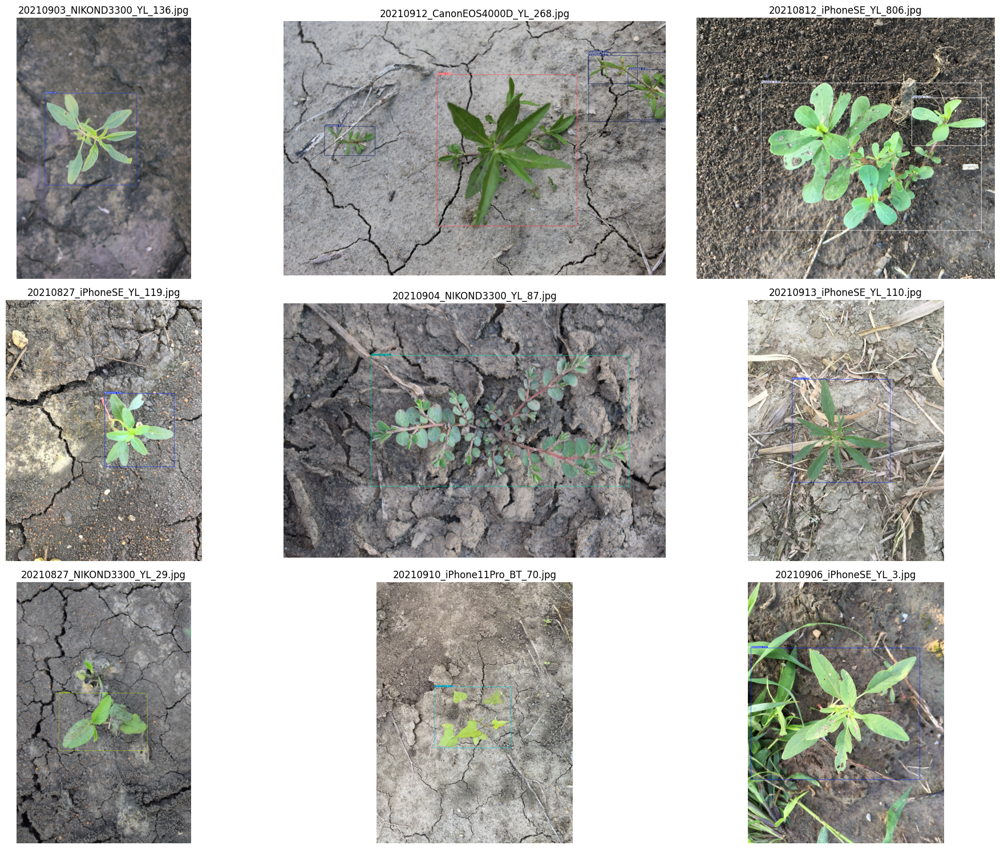

Summary plot saved to: runs/detect/cotton_weed_inference/summary_plot.png

Generating confusion matrix...
val: data=/content/cotton_weed_dataset/dataset.yaml, weights=['runs/train/cotton_weed_detection/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.25, iou_thres=0.45, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=True, save_hybrid=False, save_conf=True, save_json=False, project=runs/val, name=confusion_matrix, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.25 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-398-g5cdad892 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)

Fusing layers... 
Model summary: 157 layers, 7042489 parameters, 0 gradients, 15.9 GFLOPs
Traceback (most recent call last):
  File "/content/yolov5/val.py", line 604, in <module>
    main(opt)
  File "/content/yolov5/val.py", line 575, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.11/dist-pack

In [ ]:
# -*- coding: utf-8 -*-
"""
YOLOv5 Weed Detection for Cotton Production Systems
Based on the YOLOWeeds benchmark paper - Fixed Version
"""

# Step 1: Mount Google Drive and prepare environment
print("\n===== STEP 1: Setting up environment =====")
from google.colab import drive
drive.mount('/content/drive')
print("✓ Google Drive mounted successfully")

import os
import shutil
import random
import time
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
from datetime import datetime

# Track execution time
start_time = time.time()

# Clone YOLOv5 repository if not already present
if not os.path.exists('/content/yolov5'):
    print("\nCloning YOLOv5 repository...")
    !git clone https://github.com/ultralytics/yolov5
    %cd yolov5
    !pip install -r requirements.txt
    print("✓ YOLOv5 installed successfully")
else:
    print("\n✓ YOLOv5 already installed")
    %cd yolov5

# Step 2: Define configuration settings (based on paper findings)
print("\n===== STEP 2: Configuring settings =====")

# Configuration parameters - you can adjust as needed
CONFIG = {
    'source_images': '/content/drive/MyDrive/MSU_Khairul/CottonWeedDet12/CottonWeedDet12/weedImages',
    'source_annotations': '/content/drive/MyDrive/MSU_Khairul/CottonWeedDet12/CottonWeedDet12/annotation_YOLO_txt',
    'base_dir': '/content/cotton_weed_dataset',
    'train_split': 0.8,  # 80% for training, 20% for validation
    'img_size': 640,    # Paper used 640x640
    'batch_size': 16,   # Paper used 16
    'epochs': 30,       # Increased to 30 as requested
    'model': 'yolov5s.pt',  # Options: yolov5n.pt, yolov5s.pt, yolov5m.pt, yolov5l.pt, yolov5x.pt
    'random_seed': 42,  # For reproducibility
    'augmentation': True,  # Enable data augmentation as mentioned in the paper
    'apply_hyperparams': True,  # Apply optimal hyperparameters as in the paper
    'class_names': []   # Will be populated based on dataset
}

print(f"Dataset Configuration:")
for key, value in CONFIG.items():
    print(f"  {key}: {value}")

# Step 3: Create directory structure
print("\n===== STEP 3: Creating directory structure =====")
train_img_dir = f"{CONFIG['base_dir']}/train/images"
train_label_dir = f"{CONFIG['base_dir']}/train/labels"
val_img_dir = f"{CONFIG['base_dir']}/val/images"
val_label_dir = f"{CONFIG['base_dir']}/val/labels"

# Create directories
for dir_path in [train_img_dir, train_label_dir, val_img_dir, val_label_dir]:
    os.makedirs(dir_path, exist_ok=True)

print(f"✓ Created directories for dataset")

# Step 4: Find and verify source data
print("\n===== STEP 4: Locating source data =====")
print(f"Looking for images in: {CONFIG['source_images']}")
print(f"Looking for annotations in: {CONFIG['source_annotations']}")

if not os.path.exists(CONFIG['source_images']):
    print(f"ERROR: Source images path not found! Please check the path.")
    # Search for possible alternatives
    for root, dirs, files in os.walk('/content/drive/MyDrive', topdown=True):
        if root.count('/') > 7:  # Limit depth
            dirs[:] = []
            continue

        for dir_name in dirs:
            if "weed" in dir_name.lower() or "cotton" in dir_name.lower():
                print(f"Possible alternative found: {os.path.join(root, dir_name)}")

if not os.path.exists(CONFIG['source_annotations']):
    print(f"ERROR: Source annotations path not found! Please check the path.")

# Step 5: Find images and create dataset splits
print("\n===== STEP 5: Creating dataset splits =====")
# Find all images
all_images = []
for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.PNG']:
    files = glob(os.path.join(CONFIG['source_images'], ext))
    all_images.extend(files)
    # Also search in subdirectories
    subdir_files = glob(os.path.join(CONFIG['source_images'], '**', ext), recursive=True)
    all_images.extend(subdir_files)

# Remove duplicates (in case of overlapping searches)
all_images = list(set(all_images))

print(f"Found {len(all_images)} total images")

if len(all_images) == 0:
    print("WARNING: No images found! Checking subdirectories directly...")
    if os.path.exists(CONFIG['source_images']):
        subdirs = [os.path.join(CONFIG['source_images'], d) for d in os.listdir(CONFIG['source_images'])
                  if os.path.isdir(os.path.join(CONFIG['source_images'], d))]
        for subdir in subdirs:
            print(f"Checking {subdir}...")
            for ext in ['*.jpg', '*.jpeg', '*.png', '*.JPG', '*.PNG']:
                files = glob(os.path.join(subdir, ext))
                print(f"  Found {len(files)} {ext} files")
                all_images.extend(files)

    print(f"After checking subdirectories: found {len(all_images)} images")

# Split into train/val
random.seed(CONFIG['random_seed'])
random.shuffle(all_images)
split_idx = int(len(all_images) * CONFIG['train_split'])
train_images = all_images[:split_idx]
val_images = all_images[split_idx:]

print(f"Training set: {len(train_images)} images ({CONFIG['train_split']*100:.0f}%)")
print(f"Validation set: {len(val_images)} images ({(1-CONFIG['train_split'])*100:.0f}%)")

# Step 6: Copy images and labels
print("\n===== STEP 6: Preparing dataset =====")

def copy_images_and_labels(image_paths, img_dest_dir, label_dest_dir, dataset_name="dataset"):
    print(f"\nProcessing {dataset_name} set...")
    start = time.time()
    copied_count = 0
    missing_count = 0

    for i, img_path in enumerate(image_paths):
        if i % 100 == 0 and i > 0:
            elapsed = time.time() - start
            images_per_sec = i / elapsed if elapsed > 0 else 0
            eta = (len(image_paths) - i) / images_per_sec if images_per_sec > 0 else 0
            print(f"  Progress: {i}/{len(image_paths)} images ({i/len(image_paths)*100:.1f}%) | "
                  f"Speed: {images_per_sec:.1f} img/s | ETA: {eta:.1f}s")

        # Copy image
        img_filename = os.path.basename(img_path)
        base_filename = os.path.splitext(img_filename)[0]
        shutil.copy(img_path, os.path.join(img_dest_dir, img_filename))

        # Find and copy label file
        label_filename = f"{base_filename}.txt"
        label_path = os.path.join(CONFIG['source_annotations'], label_filename)

        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(label_dest_dir, label_filename))
            copied_count += 1
        else:
            missing_count += 1
            if missing_count <= 5:
                print(f"  Warning: No annotation for {img_filename}")
            elif missing_count == 6:
                print("  ... (more missing annotations)")

    # Calculate completion time
    elapsed = time.time() - start
    print(f"  ✓ Completed in {elapsed:.2f}s")
    print(f"  ✓ Copied {copied_count}/{len(image_paths)} annotations")

    if missing_count > 0:
        print(f"  ⚠ Missing annotations: {missing_count} images")

    return copied_count, missing_count

train_copied, train_missing = copy_images_and_labels(
    train_images, train_img_dir, train_label_dir, "training")
val_copied, val_missing = copy_images_and_labels(
    val_images, val_img_dir, val_label_dir, "validation")

# Step 7: Analyze dataset and create YAML file
print("\n===== STEP 7: Analyzing dataset and creating YAML configuration =====")
# Determine class information
all_class_ids = set()
label_files = glob(os.path.join(train_label_dir, '*.txt'))

print(f"Analyzing {min(len(label_files), 100)} label files to determine classes...")
for i, label_file in enumerate(label_files[:100]):  # Analyze a sample for speed
    try:
        with open(label_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:  # YOLO format: class x y w h
                    all_class_ids.add(int(parts[0]))
    except Exception as e:
        print(f"  Error reading {os.path.basename(label_file)}: {e}")

num_classes = len(all_class_ids)
max_class_id = max(all_class_ids) if all_class_ids else 0

print(f"✓ Found {num_classes} distinct classes")
print(f"✓ Class IDs: {sorted(all_class_ids)}")

# Map class numbers to class names from the paper if available
# This is based on the research paper's top 12 cotton weed classes
paper_class_names = [
    "Waterhemp", "MorningGlory", "Purslane", "SpottedSpurge",
    "Carpetweed", "Ragweed", "Eclipta", "PricklySida",
    "PalmerAmaranth", "Sicklepod", "Goosegrass", "CutleafGroundcherry"
]

# Use actual class names if they match the count, otherwise use generic names
if max_class_id + 1 == len(paper_class_names):
    CONFIG['class_names'] = paper_class_names
    print(f"✓ Using class names from the YOLOWeeds paper")
else:
    CONFIG['class_names'] = [f'weed_{i}' for i in range(max_class_id + 1)]
    print(f"✓ Using generic class names")

# Create dataset.yaml for YOLOv5
yaml_content = f"""# YOLOv5 dataset configuration
# Based on CottonWeedDet12 dataset from the YOLOWeeds benchmark paper

path: {CONFIG['base_dir']}
train: train/images
val: val/images

# Classes
nc: {max_class_id + 1}
names: {CONFIG['class_names']}
"""

yaml_path = f"{CONFIG['base_dir']}/dataset.yaml"
with open(yaml_path, 'w') as f:
    f.write(yaml_content)

print(f"✓ Created dataset YAML at: {yaml_path}")

# Step 8: Verify dataset
print("\n===== STEP 8: Verifying dataset =====")
train_img_count = len(os.listdir(train_img_dir))
train_label_count = len(os.listdir(train_label_dir))
val_img_count = len(os.listdir(val_img_dir))
val_label_count = len(os.listdir(val_label_dir))

print(f"Training images: {train_img_count}")
print(f"Training labels: {train_label_count}")
print(f"Validation images: {val_img_count}")
print(f"Validation labels: {val_label_count}")

if train_img_count != train_label_count:
    print(f"⚠ WARNING: Training set has {train_img_count - train_label_count} images without labels")
if val_img_count != val_label_count:
    print(f"⚠ WARNING: Validation set has {val_img_count - val_label_count} images without labels")

# Step 9: Train YOLOv5 model
print("\n===== STEP 9: Training YOLOv5 model =====")
print(f"Starting training with the following configuration:")
print(f"  Model: {CONFIG['model']}")
print(f"  Image size: {CONFIG['img_size']}")
print(f"  Batch size: {CONFIG['batch_size']}")
print(f"  Epochs: {CONFIG['epochs']}")
print(f"  Augmentation: {'Enabled' if CONFIG['augmentation'] else 'Disabled'}")
print(f"  Custom hyperparameters: {'Enabled' if CONFIG['apply_hyperparams'] else 'Disabled'}")

# Create hyp.yaml file if using custom hyperparams (based on paper findings)
if CONFIG['apply_hyperparams']:
    # These hyperparameters are based on the paper's recommendations
    # FIXED: Added copy_paste parameter that was missing before
    hyp_content = """# YOLOv5 hyperparameters for cotton weed detection
# Based on YOLOWeeds benchmark paper

lr0: 0.01  # initial learning rate
lrf: 0.1  # final learning rate fraction
momentum: 0.937
weight_decay: 0.0005
warmup_epochs: 3.0
warmup_momentum: 0.8
warmup_bias_lr: 0.1
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.20  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
fl_gamma: 0.0  # focal loss gamma
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.5  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.5  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.1  # image mixup (probability)
copy_paste: 0.1  # image copy paste (probability)
"""

    hyp_path = "data/hyp.cotton.yaml"
    with open(hyp_path, 'w') as f:
        f.write(hyp_content)
    print(f"✓ Created custom hyperparameters file at: {hyp_path}")
    hyp_arg = f"--hyp {hyp_path}"
else:
    hyp_arg = ""

# Run training command
train_cmd = (
    f"python train.py "
    f"--img {CONFIG['img_size']} "
    f"--batch {CONFIG['batch_size']} "
    f"--epochs {CONFIG['epochs']} "
    f"--data {yaml_path} "
    f"--weights {CONFIG['model']} "
    f"{hyp_arg} "
    f"--name cotton_weed_detection"
)

print("\nExecuting training command:")
print(f"  {train_cmd}")
print("\nTraining progress:")
!$train_cmd

# Step 10: Evaluate model performance
print("\n===== STEP 10: Evaluating model performance =====")
# Get path to best weights
best_weights_path = f"runs/train/cotton_weed_detection/weights/best.pt"

# Check if the model weights file exists
if os.path.exists(best_weights_path):
    print(f"Using best weights from: {best_weights_path}")

    # Validate the model
    print("\nRunning validation to calculate mAP metrics:")
    !python val.py --weights {best_weights_path} --data {yaml_path} --img {CONFIG['img_size']} --batch {CONFIG['batch_size']} --task val --name cotton_weed_evaluation

    # Step 11: Run inference on test images
    print("\n===== STEP 11: Running inference on test images =====")
    print(f"Running detection on validation images:")
    !python detect.py --weights {best_weights_path} --source {val_img_dir} --img-size {CONFIG['img_size']} --conf-thres 0.25 --name cotton_weed_inference

    # Step 12: Display results
    print("\n===== STEP 12: Visualization and analysis =====")
    results_path = 'runs/detect/cotton_weed_inference'
    result_images = glob(f"{results_path}/*.jpg")
    result_count = len(result_images)

    print(f"Detection results saved to: {results_path}")
    print(f"Total detection results: {result_count} images")

    # Plot some results
    if result_count > 0:
        print("\nDisplaying sample detection results:")
        plt.figure(figsize=(20, 15))

        # Plot up to 9 images
        for i, img_path in enumerate(result_images[:9]):
            if i >= 9:
                break

            plt.subplot(3, 3, i+1)
            img = plt.imread(img_path)
            plt.imshow(img)
            plt.title(os.path.basename(img_path))
            plt.axis('off')

        plt.tight_layout()
        plt.savefig(f"{results_path}/summary_plot.png")
        plt.show()
        print(f"Summary plot saved to: {results_path}/summary_plot.png")

    # Create confusion matrix
    print("\nGenerating confusion matrix...")
    !python val.py --weights {best_weights_path} --data {yaml_path} --task test --name confusion_matrix --conf-thres 0.25 --iou-thres 0.45 --save-txt --save-conf

    # Step 13: Save and export model
    print("\n===== STEP 13: Saving and exporting model =====")
    # Export to ONNX format for deployment
    !python export.py --weights {best_weights_path} --include onnx
else:
    print(f"⚠ ERROR: Training did not complete successfully. Model weights not found at {best_weights_path}")
    print("Please check the training logs above for errors.")

# Calculate total execution time
total_time = time.time() - start_time
hours, remainder = divmod(total_time, 3600)
minutes, seconds = divmod(remainder, 60)

print("\n===== EXECUTION SUMMARY =====")
print(f"Total execution time: {int(hours)}h {int(minutes)}m {seconds:.2f}s")
print(f"Dataset size: {train_img_count + val_img_count} images")
print(f"Model: YOLOv5 ({CONFIG['model'].replace('.pt', '')})")
print(f"Training epochs: {CONFIG['epochs']}")

if os.path.exists(best_weights_path):
    print(f"Results saved to:")
    print(f"  - Best weights: {best_weights_path}")
    print(f"  - Detection results: {results_path}")
    print(f"  - Training logs: runs/train/cotton_weed_detection")
else:
    print("⚠ Training failed - no model weights were produced")
    print("  - Check the training logs for errors")

print("\nThis script is based on the YOLOWeeds benchmark paper by Dang et al.")
print("https://github.com/DongChen06/DCW")